Setup


In [35]:
# Setup for Colab and CIFAR-10
import sys
IN_COLAB = 'google.colab' in sys.modules
if IN_COLAB:
    import torchvision
    torchvision.datasets.CIFAR10(root=".", download=True)

%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 100  # Set this to 300 to get better image quality
from PIL import Image
import seaborn as sns
import imageio

import glob, random, os
import numpy as np

import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torch import nn
from torch.nn import Conv2d
from torch.optim import Adam

IMG_SIZE = 32   # CIFAR-10 원본 해상도 유지
EPOCHS = 1000
BATCH_SIZE = 256
TIMESTEPS = 100

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
CHANNELS = 3

# Seed 고정
np.random.seed(42)
torch.random.manual_seed(42)
random.seed(42)
torch.cuda.manual_seed_all(42)
os.environ['PYTHONHASHSEED'] = '42'
torch.backends.cudnn.deterministic = True

DEVICE


device(type='cuda')

Utils

In [43]:
def image_to_tensor(image):
    """Convert a PIL image to a PyTorch tensor.

    Args:
        image (PIL.Image): The image to be converted.

    Returns:
        torch.Tensor: The converted PyTorch tensor.
    """
    # Define the image transformation pipeline
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.Lambda(lambda t: (t - 0.5) * 2.)
    ])

    # Apply the transformation pipeline to the image
    return transform(image)


def tensor_to_img(tensor):
    """Convert a PyTorch tensor to a PIL image.

    Args:
        tensor (torch.Tensor): The PyTorch tensor to be converted.

    Returns:
        PIL.Image: The converted PIL image.
    """
    # Define the tensor transformation pipeline
    transform = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1.) / 2.),
        transforms.Lambda(lambda t: torch.clamp(t, min=0., max=1.)),
        transforms.ToPILImage()
    ])

    # Apply the transformation pipeline to the tensor
    return transform(tensor)


def show_from_image_list(img_list, img_num=10, filename=None):
    """Show a grid of images from a list of images. Sample uniformly spaced images.
        (Alternativly, use make_grid from torchvision.utils)

    Args:
        img_list (list): The list of images to be displayed. Can be PIL or image tensors.
        img_num (int, optional): The number of images to be displayed. Default is 10.
        filename (str, optional): The name of the file to save the plot to. If None, the plot will not be saved. Default is None.
    """
    # Ensure that the number of images to be displayed is less than or equal to the number of images in the list
    img_num = min(len(img_list), img_num)

    # Get the index of the images to be displayed
    img_num_index = np.linspace(0, len(img_list)-1.0, num=img_num).astype(int)

    # Clear the current figure (if there is any)
    plt.clf()

    # Create a figure with 1 row and `img_num` columns
    fig, ax = plt.subplots(1, img_num, figsize=(15, 15), gridspec_kw={'width_ratios': [1] * img_num})

    # Iterate through the images to be displayed
    for i, idx in enumerate(img_num_index):
        img_i = img_list[idx]

        # Check if the image is a PyTorch tensor and convert it to PIL
        if isinstance(img_i, torch.Tensor):
            img_i = tensor_to_img(img_i)

        # Display the image
        ax[i].imshow(img_i)
        ax[i].axis('off')

    # Save the plot to a file if the filename is provided
    if filename is not None:
        plt.savefig(filename, dpi=300, bbox_inches='tight')

    # Show the plot
    plt.show()


Dataset& Loader


In [44]:
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms

class ImageDataset(Dataset):
  """A dataset wrapper for CIFAR-10, filtered to only include a single class images."""

  def __init__(self):

    self.on_the_fly_transform = transforms.Compose([
        transforms.RandomHorizontalFlip(0.5),
        transforms.RandomApply([transforms.RandomCrop(int(IMG_SIZE * 0.8))], p=0.1),
        transforms.RandomAutocontrast(p=0.1),
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.Lambda(lambda t: torch.clamp(t, min=-1., max=1.)),
    ])

    # Load CIFAR-10 dataset
    all_data = torchvision.datasets.CIFAR10(root=".", train=True, download=True, transform=transforms.ToTensor())

    # Filter only a single class
    self.img_list = [x for x, y in all_data if y == 3]


  def __getitem__(self, index):
    img = self.img_list[index]
    img = self.on_the_fly_transform(img)
    return img

  def get_pil_image(self, index, with_random_augmentation=True):
    if with_random_augmentation:
      return tensor_to_img(self.__getitem__(index))
    return tensor_to_img(self.img_list[index])

  def __len__(self):
    return len(self.img_list)


# ✅ Use the dataset as before
dataset = ImageDataset()
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)


In [45]:
# Note hat just grabbing an image from the dataset adds a random image augmentation.
# Generally speaking, this will be False. Try a few times.
torch.all(dataset[0] == dataset[0])  # torch.all test if all entries are True

tensor(False)

Inspecting the dataset


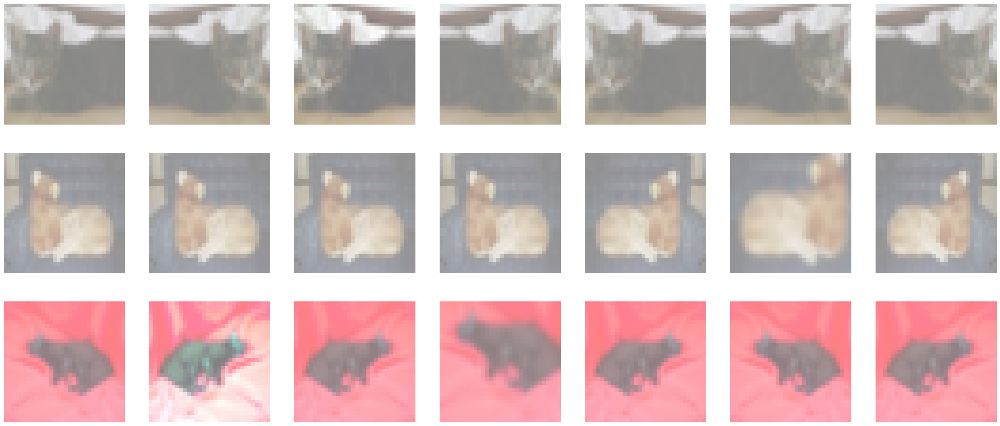

In [46]:
# Visualize the data (CIFAR-10, car class)

images_per_row = 7
num_rows = 3
fig, axes = plt.subplots(num_rows, images_per_row, figsize=(images_per_row * 5, num_rows * 5))

# Plotting each image in a subplot
for i, ax in enumerate(axes.flat):
    index = i // images_per_row
    if index >= len(dataset):
        ax.axis('off')
        continue
    with_random_augmentation = False if i % images_per_row == 0 else True
    img = dataset.get_pil_image(index, with_random_augmentation=with_random_augmentation)
    ax.imshow(img)
    ax.axis('off')

plt.savefig('dataset_summary.png', bbox_inches='tight')
plt.show()


In [47]:
# Create giant tensor with all images.
img_num = len(dataset.img_list)
tensor_with_all_images = torch.zeros((img_num, CHANNELS, IMG_SIZE, IMG_SIZE))
for i, img in enumerate(dataset.img_list):
  tensor_with_all_images[i,:,:,:] = img

# Save the pixel values of all images in 1D tensor for each channel.
pixels_red = tensor_with_all_images[:,0,:,:].flatten().numpy()
pixels_green = tensor_with_all_images[:,1,:,:].flatten().numpy()
pixels_blue = tensor_with_all_images[:,2,:,:].flatten().numpy()

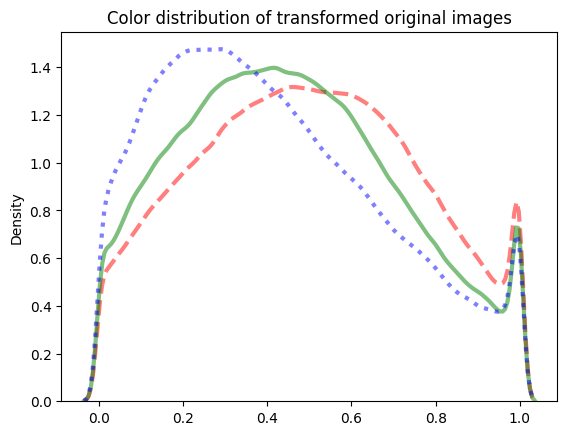

In [48]:
ax = sns.kdeplot(pixels_red, color="red", alpha=0.5, ls="--", lw=3)
sns.kdeplot(pixels_green, color="green", ax=ax, alpha=0.5, lw=3)
sns.kdeplot(pixels_blue, color="blue", ax=ax, alpha=0.5, ls=":", lw=3)
plt.title("Color distribution of transformed original images")
plt.savefig('color_distribution_original_images.png', dpi=300, bbox_inches='tight')

Visualize Forward process


In [51]:
# # DDPM forward noise schedule 정의
# def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
#     return torch.linspace(start, end, timesteps)

# # 전역 스케줄 변수 설정
# betas = linear_beta_schedule(TIMESTEPS)
# alphas = 1.0 - betas
# alphas_cumprod = torch.cumprod(alphas, dim=0)
# sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
# sqrt_one_minus_alphas_cumprod = torch.sqrt(1.0 - alphas_cumprod)

# # 배치 차원에 맞게 t 타임스텝 값 가져오는 유틸 함수
# def get_index_from_list(vals, t, x_shape):
#     batch_size = t.shape[0]
#     out = vals.gather(-1, t.cpu())
#     return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

# # DDPM 방식으로 한 스텝 forward diffusion 수행
# def one_step_forward(img, t):
#     noise = torch.randn_like(img).to(DEVICE)
#     t_tensor = torch.tensor([t], device=DEVICE).long()

#     sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t_tensor, img.shape)
#     sqrt_one_minus_alphas_cumprod_t = get_index_from_list(sqrt_one_minus_alphas_cumprod, t_tensor, img.shape)

#     x_t = sqrt_alphas_cumprod_t * img + sqrt_one_minus_alphas_cumprod_t * noise
#     return x_t



# def create_forward_animation(dataset):
#   img = dataset.img_list[0].to(DEVICE)
#   img_list = list()
#   # if TIMESTEPS is too large, you can use a subset
#   img_list.append(tensor_to_img(img))
#   for t in range(TIMESTEPS):
#     img = one_step_forward(img, t=t)
#     img_list.append(tensor_to_img(img))
#   return img_list

# img_list = create_forward_animation(dataset)

# # the .gif file can get pretty large
# imageio.mimsave("forward_animate.gif", img_list, fps=10)
# # we can also show the images inline
# show_from_image_list(img_list, filename = 'forward_grid.png')


Hyperparameters

In [52]:
# new hyperparams
TIMESTEPS = 1000
START = 0.0001
END = 0.01
LEARNING_RATE = 0.001

<Figure size 640x480 with 0 Axes>

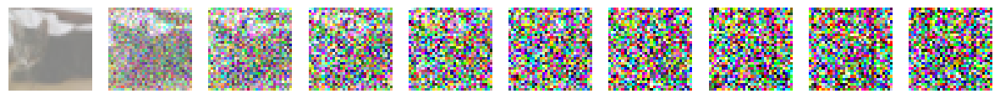

In [53]:
def generate_schedule(start = START, end = END, timesteps=TIMESTEPS):
    """
    Generates a schedule of beta and alpha values for a forward process.

    Args:
    start (float): The starting value for the beta values. Default is START.
    end (float): The ending value for the beta values. Default is END.
    timesteps (int): The number of timesteps to generate. Default is TIMESTEPS.

    Returns:
    tuple: A tuple of three tensors containing the beta values, alpha values, and
    cumulative alpha values (alpha bars).
    """
    betas = torch.linspace(start, end, timesteps, device = DEVICE)
    alphas = 1.0 - betas
    alpha_bars = torch.cumprod(alphas, axis=0)
    return betas, alphas, alpha_bars

def one_step_forward_correct(img, t, schedule):
    """
    Performs one step of a forward process.
    Implements the first equation from https://youtu.be/a4Yfz2FxXiY?t=649

    Args:
    img (torch.Tensor): The input image tensor.
    t (int): The current time step.
    schedule (torch.Tensor): The schedule of beta values.

    Returns:
    torch.Tensor: The output image tensor after one step of the forward process.
    """
    beta_t = schedule[t]
    noise = torch.randn_like(img, device = DEVICE)
    img = torch.sqrt(1.0 - beta_t) * img + torch.sqrt(beta_t) * noise
    return img

def create_forward_animation_correct(dataset, schedule):
    """
    Creates an animation of a forward process for a given dataset (list).

    Args:
    dataset (Dataset): The input dataset, e.g. list of images.
    schedule (torch.Tensor): The schedule of beta values.

    Returns:
    list: A list of PIL images representing the animation frames.
    """
    img = dataset.img_list[0].to(DEVICE)
    img_list = list()
    # if TIMESTEPS is too large, you can use a subset
    img_list.append(tensor_to_img(img))
    for t in range(TIMESTEPS):
      img = one_step_forward_correct(img, t, schedule)
      img_list.append(tensor_to_img(img))
    return img_list

betas, alphas, alpha_bars = generate_schedule()
img_list = create_forward_animation_correct(dataset, betas)

# the .gif file can get pretty large
imageio.mimsave("forward_animate_correct.gif", img_list, fps=30)
# we can also show the images inline
show_from_image_list(img_list, filename = 'forward_grid_correct.png')

In [54]:
def correct_dims(x):
    """
    Checks the shape of a given tensor and adds batch dimension if necessary.

    Args:
    x (torch.Tensor): The input tensor.

    Returns:
    torch.Tensor: The output tensor with corrected shape: (batch_dim, CHANNELS, IMG_SIZE, IMG_SIZE)
    """
    if x.dim() == 2:
        assert(False)
    elif x.dim() == 3:
        batch_dim = 1
        x = x.reshape(batch_dim, CHANNELS, IMG_SIZE, IMG_SIZE)
    elif x.dim() == 4:
        return x
    else:
        assert(False)

    return x


Forward process

torch.Size([700, 3, 32, 32])


<Figure size 640x480 with 0 Axes>

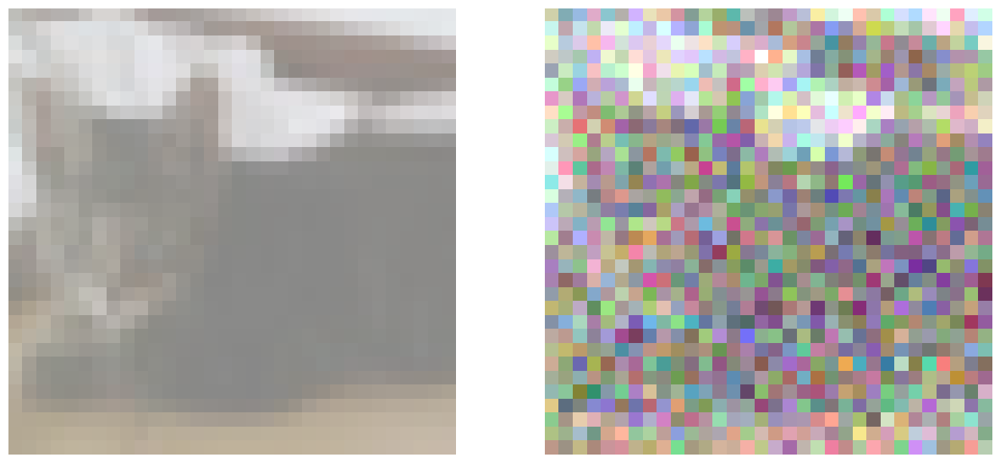

In [55]:
def forward_diffusion(img, future_t, betas):
    """
    Performs a forward diffusion process on an input image tensor.
    Implements the second equation from https://youtu.be/a4Yfz2FxXiY?t=649
    """
    img = correct_dims(img)
    batch_dim = img.shape[0]

    noise = torch.randn_like(img)
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)

    # 🔧 gather → 간단한 인덱싱으로 교체
    alphabar_t = alphas_cumprod[future_t]
    img_mean = torch.sqrt(alphabar_t).view((batch_dim,1,1,1)) * img
    img_std = torch.sqrt(1.-alphabar_t).view((batch_dim,1,1,1))
    noise_img = img_mean + img_std * noise

    return noise_img, noise

# 테스트: 배치 단위로 노이즈 적용
batches = 700
batched_img = torch.rand(batches, CHANNELS, IMG_SIZE, IMG_SIZE, device=DEVICE)
t_batched = torch.randint(0, 10, (batches,), device=DEVICE).flatten()
noise_img, noise = forward_diffusion(batched_img, t_batched, betas)
print(noise_img.shape)

# 시각화: 10% step에서의 노이즈 이미지
img_test = dataset.img_list[0].to(DEVICE)
future_t = torch.tensor([TIMESTEPS // 10], device=DEVICE)
noise_img, noise = forward_diffusion(img_test, future_t, betas)
img_test = tensor_to_img(img_test.squeeze())
noise_img = tensor_to_img(noise_img.squeeze())

show_from_image_list([img_test, noise_img])


Visualize forward RGB

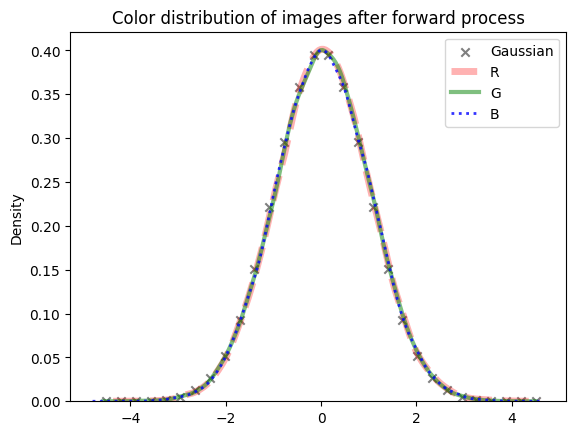

In [56]:
def standard_normal_pdf(x):
  import scipy
  import scipy.stats
  return scipy.stats.norm(0, 1).pdf(x)

# Create giant tensor with, let's say, 50 images
img_num = 50
tensor_with_all_images = torch.zeros((img_num, CHANNELS, IMG_SIZE, IMG_SIZE))
for i in range(img_num):
  img_test = dataset.img_list[i].to(DEVICE)
  future_t = torch.tensor([TIMESTEPS - 1], device=DEVICE)
  noise_img, noise = forward_diffusion(img_test, future_t, betas)
  tensor_with_all_images[i,:,:,:] = noise_img

# Save the pixel values of all images in 1D tensor for each channel.
pixels_red = tensor_with_all_images[:,0,:,:].flatten().cpu().numpy()
pixels_green = tensor_with_all_images[:,1,:,:].flatten().cpu().numpy()
pixels_blue = tensor_with_all_images[:,2,:,:].flatten().cpu().numpy()

plt.clf()
x_values = np.linspace(-4.5, 4.5, 30)
plt.scatter(x_values, [standard_normal_pdf(x) for x in x_values], c='black', alpha=0.5, marker='x', label='Gaussian')

ax = sns.kdeplot(pixels_red, color="red", alpha=0.3, ls="--", lw=5, label='R')
sns.kdeplot(pixels_green, color="green", ax=ax, alpha=0.5, lw=3, label='G')
sns.kdeplot(pixels_blue, color="blue", ax=ax, alpha=0.8, ls=":", lw=2, label='B')
plt.legend()

plt.title("Color distribution of images after forward process")
plt.savefig('color_distribution_normal_reference.png', dpi=300, bbox_inches='tight')


Model

In [57]:
!pip install -q -U einops

In [58]:
from inspect import isfunction
from functools import partial
from einops import rearrange
from torch import nn, einsum
import math



def exists(x):
    return x is not None

def default(val, d):
    if exists(val):
        return val
    return d() if isfunction(d) else d

class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x

def Upsample(dim):
    return nn.ConvTranspose2d(dim, dim, 4, 2, 1)

def Downsample(dim):
    return nn.Conv2d(dim, dim, 4, 2, 1)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class Block(nn.Module):
    def __init__(self, dim, dim_out, groups = 8):
        super().__init__()
        self.proj = nn.Conv2d(dim, dim_out, 3, padding = 1)
        self.norm = nn.GroupNorm(groups, dim_out)
        self.act = nn.SiLU()

    def forward(self, x, scale_shift = None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return x

class ResnetBlock(nn.Module):
    """https://arxiv.org/abs/1512.03385"""

    def __init__(self, dim, dim_out, *, time_emb_dim=None, groups=8):
        super().__init__()
        self.mlp = (
            nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, dim_out))
            if exists(time_emb_dim)
            else None
        )

        self.block1 = Block(dim, dim_out, groups=groups)
        self.block2 = Block(dim_out, dim_out, groups=groups)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        h = self.block1(x)

        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            h = rearrange(time_emb, "b c -> b c 1 1") + h

        h = self.block2(h)
        return h + self.res_conv(x)

class ConvNextBlock(nn.Module):
    """https://arxiv.org/abs/2201.03545"""

    def __init__(self, dim, dim_out, *, time_emb_dim=None, mult=2, norm=True):
        super().__init__()
        self.mlp = (
            nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, dim))
            if exists(time_emb_dim)
            else None
        )

        self.ds_conv = nn.Conv2d(dim, dim, 7, padding=3, groups=dim)

        self.net = nn.Sequential(
            nn.GroupNorm(1, dim) if norm else nn.Identity(),
            nn.Conv2d(dim, dim_out * mult, 3, padding=1),
            nn.GELU(),
            nn.GroupNorm(1, dim_out * mult),
            nn.Conv2d(dim_out * mult, dim_out, 3, padding=1),
        )

        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        h = self.ds_conv(x)

        if exists(self.mlp) and exists(time_emb):
            assert exists(time_emb), "time embedding must be passed in"
            condition = self.mlp(time_emb)
            h = h + rearrange(condition, "b c -> b c 1 1")

        h = self.net(h)
        return h + self.res_conv(x)

class Attention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )
        q = q * self.scale

        sim = einsum("b h d i, b h d j -> b h i j", q, k)
        sim = sim - sim.amax(dim=-1, keepdim=True).detach()
        attn = sim.softmax(dim=-1)

        out = einsum("b h i j, b h d j -> b h i d", attn, v)
        out = rearrange(out, "b h (x y) d -> b (h d) x y", x=h, y=w)
        return self.to_out(out)

class LinearAttention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)

        self.to_out = nn.Sequential(nn.Conv2d(hidden_dim, dim, 1),
                                    nn.GroupNorm(1, dim))

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )

        q = q.softmax(dim=-2)
        k = k.softmax(dim=-1)

        q = q * self.scale
        context = torch.einsum("b h d n, b h e n -> b h d e", k, v)

        out = torch.einsum("b h d e, b h d n -> b h e n", context, q)
        out = rearrange(out, "b h c (x y) -> b (h c) x y", h=self.heads, x=h, y=w)
        return self.to_out(out)


class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = nn.GroupNorm(1, dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)

class Unet(nn.Module):
    def __init__(
        self,
        dim=IMG_SIZE,
        init_dim=None,
        out_dim=None,
        dim_mults=(1, 2, 4, 8),
        channels=CHANNELS,
        with_time_emb=True,
        resnet_block_groups=8,
        use_convnext=True,
        convnext_mult=2,
    ):
        super().__init__()

        # determine dimensions
        self.channels = channels

        init_dim = default(init_dim, dim // 3 * 2)
        self.init_conv = nn.Conv2d(channels, init_dim, 7, padding=3)

        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        in_out = list(zip(dims[:-1], dims[1:]))

        if use_convnext:
            block_klass = partial(ConvNextBlock, mult=convnext_mult)
        else:
            block_klass = partial(ResnetBlock, groups=resnet_block_groups)

        # time embeddings
        if with_time_emb:
            time_dim = dim * 4
            self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(dim),
                nn.Linear(dim, time_dim),
                nn.GELU(),
                nn.Linear(time_dim, time_dim),
            )
        else:
            time_dim = None
            self.time_mlp = None

        # layers
        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(
                nn.ModuleList(
                    [
                        block_klass(dim_in, dim_out, time_emb_dim=time_dim),
                        block_klass(dim_out, dim_out, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                        Downsample(dim_out) if not is_last else nn.Identity(),
                    ]
                )
            )

        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out[1:])):
            is_last = ind >= (num_resolutions - 1)

            self.ups.append(
                nn.ModuleList(
                    [
                        block_klass(dim_out * 2, dim_in, time_emb_dim=time_dim),
                        block_klass(dim_in, dim_in, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                        Upsample(dim_in) if not is_last else nn.Identity(),
                    ]
                )
            )

        out_dim = default(out_dim, channels)
        self.final_conv = nn.Sequential(
            block_klass(dim, dim), nn.Conv2d(dim, out_dim, 1)
        )

    def forward(self, x, time):
        x = correct_dims(x)
        img_withnoise = x*1.0
        img_shape = img_withnoise.shape


        x = self.init_conv(x)

        t = self.time_mlp(time) if exists(self.time_mlp) else None

        h = []

        # downsample
        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            h.append(x)
            x = downsample(x)

        # bottleneck
        x = self.mid_block1(x, t)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t)

        # upsample
        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim=1)
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            x = upsample(x)

        x = self.final_conv(x)
        x = img_withnoise-x # here x is the img wo noise
        return x.squeeze()

timestep = torch.randn(1, device = DEVICE)

model = Unet(
    dim=IMG_SIZE,
    channels=CHANNELS,
    dim_mults=(1, 2, 4,)
).to(DEVICE)
img = torch.randn([1, 3, IMG_SIZE, IMG_SIZE]).to(DEVICE)
out = model(img, timestep)
out.shape


torch.Size([3, 32, 32])

Inference

In [59]:
def denoise_one_step(model, img, t, betas):
    """
    Performs one step of denoising on an input image tensor (unbatched) using a given denoising model.

    Args:
    model: The denoising model.
    img (torch.Tensor): The input image tensor.
    t (int): The current time step.
    betas (torch.Tensor): The schedule of beta values.

    Returns:
    torch.Tensor: The output image tensor after one step of denoising.
    """
    beta_t = betas[t]
    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_t = alphas_cumprod[t]
    sqrt_one_minus_alphas_cumprod_t = torch.sqrt(1. - alphas_cumprod_t)
    sqrt_recip_alphas_t = torch.sqrt(1.0 / alphas[t])

    t_tensor = torch.tensor([float(t)], device=DEVICE)
    model_out = model(img, t_tensor)
    # This is directly from the 2020 Ho paper.
    # Line 4 of the sampling Algorithm is split into two parts: Mean and std.
    # The mean is the first part (until the +). Here, it is stlightly rewritten.
    # E.g. 1-alpha_t is equal to beta_t
    model_mean = sqrt_recip_alphas_t * (img - beta_t * model_out / sqrt_one_minus_alphas_cumprod_t)

    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    # the posterior equation is baesd 3.2 in the 2020 Ho paper (also used in the Annotated ... referecne)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)
    posterior_variance_t = posterior_variance[t]
    posterior_std_t = torch.sqrt(posterior_variance_t)

    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(img, device = DEVICE)
        return model_mean + posterior_std_t * noise


In [60]:
@torch.no_grad()
def generate_example(model, epoch, betas):
    """
    Generates an example image using a given denoising model.

    Args:
    model: The denoising model.
    epoch (int): The current epoch.
    betas (torch.Tensor): The schedule of beta values.

    Returns:
    None
    """
    plt.clf()
    img = torch.randn((CHANNELS, IMG_SIZE, IMG_SIZE), device = DEVICE)
    img_num = 11
    img_num_index = np.linspace(0,TIMESTEPS, num=img_num-1)
    img_num_index = [int(x+0.5) for x in img_num_index]
    fig, ax = plt.subplots(1, img_num, figsize=(15,15), gridspec_kw={'width_ratios': [1]*img_num})
    ax_index = img_num-1
    ax[ax_index].imshow(tensor_to_img(img))
    ax[ax_index].axis('off')
    ax_index -= 1
    for t, beta_t in list(enumerate(betas))[::-1]:
        img = denoise_one_step(model, img, t, betas)
        img = torch.clamp(img, min=-4.0, max=4.0)
        if t <= img_num_index[-1]:
            img_num_index.pop()
            ax[ax_index].imshow(tensor_to_img(img))
            ax[ax_index].axis('off')
            ax_index -= 1

    plt.savefig(f"reverse_process_reference_epoch_{str(epoch).zfill(6)}.png", dpi=300, bbox_inches='tight')
    plt.show()

    return None


Training


In [61]:
def train_epoch(model, dataloader, optimizer, schedule):
    """
    Trains a denoising model for one epoch using a given data loader and optimizer.
    Returns average loss.
    """
    loss_list = []
    future_t_max = schedule.numel()  # T steps

    for img in dataloader:
        img = img.to(DEVICE)
        batch_size = img.shape[0]
        optimizer.zero_grad()

        future_t = torch.randint(0, future_t_max, (batch_size,), device=DEVICE)
        img_with_noise, noise_gt = forward_diffusion(img, future_t, schedule)

        noise_pred = model(img_with_noise, future_t)
        noise_gt = noise_gt.squeeze()

        loss = F.mse_loss(noise_pred, noise_gt)
        loss.backward()
        optimizer.step()

        loss_list.append(loss.item())

    return np.mean(loss_list)


Loss in epoch 0 is: 0.3317


<Figure size 640x480 with 0 Axes>

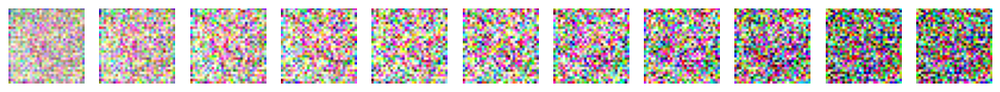

Loss in epoch 1 is: 0.1918
Loss in epoch 2 is: 0.1827
Loss in epoch 3 is: 0.1740
Loss in epoch 4 is: 0.1680
Loss in epoch 5 is: 0.1719
Loss in epoch 6 is: 0.1690
Loss in epoch 7 is: 0.1646
Loss in epoch 8 is: 0.1610
Loss in epoch 9 is: 0.1675
Loss in epoch 10 is: 0.1602
Loss in epoch 11 is: 0.1666
Loss in epoch 12 is: 0.1585
Loss in epoch 13 is: 0.1548
Loss in epoch 14 is: 0.1439
Loss in epoch 15 is: 0.1362
Loss in epoch 16 is: 0.1478
Loss in epoch 17 is: 0.1454
Loss in epoch 18 is: 0.1319
Loss in epoch 19 is: 0.1073
Loss in epoch 20 is: 0.0944


<Figure size 640x480 with 0 Axes>

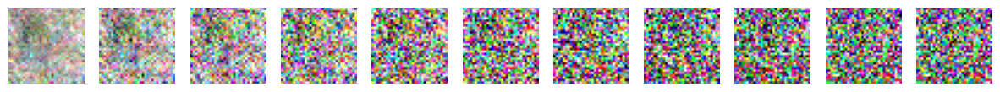

Loss in epoch 21 is: 0.0880
Loss in epoch 22 is: 0.0820
Loss in epoch 23 is: 0.0735
Loss in epoch 24 is: 0.0687
Loss in epoch 25 is: 0.0648
Loss in epoch 26 is: 0.0593
Loss in epoch 27 is: 0.0584
Loss in epoch 28 is: 0.0553
Loss in epoch 29 is: 0.0527
Loss in epoch 30 is: 0.0519
Loss in epoch 31 is: 0.0508
Loss in epoch 32 is: 0.0512
Loss in epoch 33 is: 0.0482
Loss in epoch 34 is: 0.0464
Loss in epoch 35 is: 0.0489
Loss in epoch 36 is: 0.0470
Loss in epoch 37 is: 0.0460
Loss in epoch 38 is: 0.0454
Loss in epoch 39 is: 0.0476
Loss in epoch 40 is: 0.0442


<Figure size 640x480 with 0 Axes>

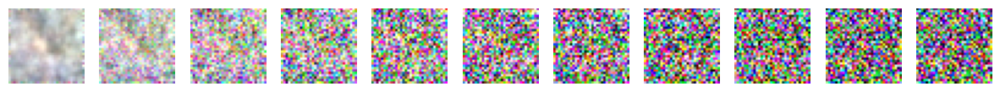

Loss in epoch 41 is: 0.0447
Loss in epoch 42 is: 0.0453
Loss in epoch 43 is: 0.0441
Loss in epoch 44 is: 0.0443
Loss in epoch 45 is: 0.0441
Loss in epoch 46 is: 0.0428
Loss in epoch 47 is: 0.0416
Loss in epoch 48 is: 0.0432
Loss in epoch 49 is: 0.0402
Loss in epoch 50 is: 0.0400
Loss in epoch 51 is: 0.0408
Loss in epoch 52 is: 0.0415
Loss in epoch 53 is: 0.0406
Loss in epoch 54 is: 0.0393
Loss in epoch 55 is: 0.0375
Loss in epoch 56 is: 0.0378
Loss in epoch 57 is: 0.0399
Loss in epoch 58 is: 0.0382
Loss in epoch 59 is: 0.0371
Loss in epoch 60 is: 0.0387


<Figure size 640x480 with 0 Axes>

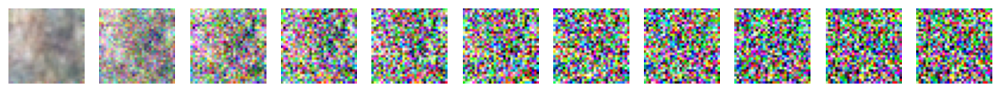

Loss in epoch 61 is: 0.0381
Loss in epoch 62 is: 0.0387
Loss in epoch 63 is: 0.0363
Loss in epoch 64 is: 0.0368
Loss in epoch 65 is: 0.0366
Loss in epoch 66 is: 0.0364
Loss in epoch 67 is: 0.0385
Loss in epoch 68 is: 0.0361
Loss in epoch 69 is: 0.0357
Loss in epoch 70 is: 0.0355
Loss in epoch 71 is: 0.0346
Loss in epoch 72 is: 0.0360
Loss in epoch 73 is: 0.0364
Loss in epoch 74 is: 0.0360
Loss in epoch 75 is: 0.0352
Loss in epoch 76 is: 0.0337
Loss in epoch 77 is: 0.0364
Loss in epoch 78 is: 0.0356
Loss in epoch 79 is: 0.0349
Loss in epoch 80 is: 0.0346


<Figure size 640x480 with 0 Axes>

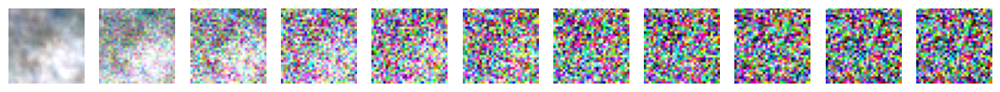

Loss in epoch 81 is: 0.0350
Loss in epoch 82 is: 0.0352
Loss in epoch 83 is: 0.0331
Loss in epoch 84 is: 0.0344
Loss in epoch 85 is: 0.0339
Loss in epoch 86 is: 0.0338
Loss in epoch 87 is: 0.0346
Loss in epoch 88 is: 0.0348
Loss in epoch 89 is: 0.0338
Loss in epoch 90 is: 0.0322
Loss in epoch 91 is: 0.0337
Loss in epoch 92 is: 0.0352
Loss in epoch 93 is: 0.0326
Loss in epoch 94 is: 0.0343
Loss in epoch 95 is: 0.0325
Loss in epoch 96 is: 0.0327
Loss in epoch 97 is: 0.0324
Loss in epoch 98 is: 0.0328
Loss in epoch 99 is: 0.0324
Loss in epoch 100 is: 0.0337


<Figure size 640x480 with 0 Axes>

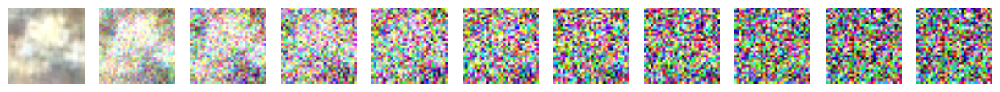

Loss in epoch 101 is: 0.0316
Loss in epoch 102 is: 0.0332
Loss in epoch 103 is: 0.0320
Loss in epoch 104 is: 0.0327
Loss in epoch 105 is: 0.0340
Loss in epoch 106 is: 0.0336
Loss in epoch 107 is: 0.0310
Loss in epoch 108 is: 0.0314
Loss in epoch 109 is: 0.0333
Loss in epoch 110 is: 0.0323
Loss in epoch 111 is: 0.0318
Loss in epoch 112 is: 0.0312
Loss in epoch 113 is: 0.0326
Loss in epoch 114 is: 0.0305
Loss in epoch 115 is: 0.0319
Loss in epoch 116 is: 0.0319
Loss in epoch 117 is: 0.0310
Loss in epoch 118 is: 0.0308
Loss in epoch 119 is: 0.0319
Loss in epoch 120 is: 0.0301


<Figure size 640x480 with 0 Axes>

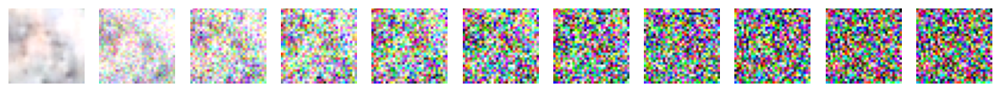

Loss in epoch 121 is: 0.0320
Loss in epoch 122 is: 0.0308
Loss in epoch 123 is: 0.0318
Loss in epoch 124 is: 0.0315
Loss in epoch 125 is: 0.0293
Loss in epoch 126 is: 0.0303
Loss in epoch 127 is: 0.0320
Loss in epoch 128 is: 0.0288
Loss in epoch 129 is: 0.0311
Loss in epoch 130 is: 0.0294
Loss in epoch 131 is: 0.0305
Loss in epoch 132 is: 0.0300
Loss in epoch 133 is: 0.0311
Loss in epoch 134 is: 0.0297
Loss in epoch 135 is: 0.0290
Loss in epoch 136 is: 0.0288
Loss in epoch 137 is: 0.0294
Loss in epoch 138 is: 0.0310
Loss in epoch 139 is: 0.0313
Loss in epoch 140 is: 0.0296


<Figure size 640x480 with 0 Axes>

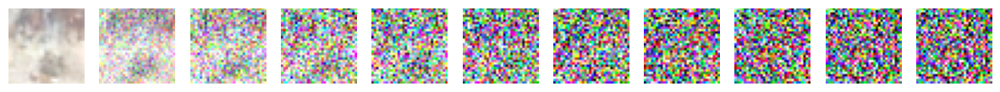

Loss in epoch 141 is: 0.0292
Loss in epoch 142 is: 0.0300
Loss in epoch 143 is: 0.0304
Loss in epoch 144 is: 0.0298
Loss in epoch 145 is: 0.0291
Loss in epoch 146 is: 0.0290
Loss in epoch 147 is: 0.0286
Loss in epoch 148 is: 0.0289
Loss in epoch 149 is: 0.0302
Loss in epoch 150 is: 0.0298
Loss in epoch 151 is: 0.0292
Loss in epoch 152 is: 0.0294
Loss in epoch 153 is: 0.0295
Loss in epoch 154 is: 0.0305
Loss in epoch 155 is: 0.0299
Loss in epoch 156 is: 0.0285
Loss in epoch 157 is: 0.0302
Loss in epoch 158 is: 0.0297
Loss in epoch 159 is: 0.0274
Loss in epoch 160 is: 0.0287


<Figure size 640x480 with 0 Axes>

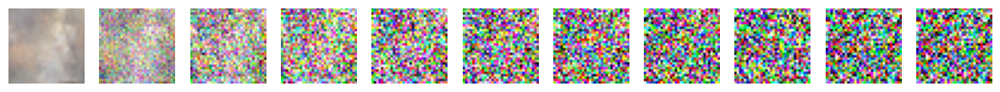

Loss in epoch 161 is: 0.0292
Loss in epoch 162 is: 0.0296
Loss in epoch 163 is: 0.0281
Loss in epoch 164 is: 0.0298
Loss in epoch 165 is: 0.0288
Loss in epoch 166 is: 0.0285
Loss in epoch 167 is: 0.0285
Loss in epoch 168 is: 0.0280
Loss in epoch 169 is: 0.0284
Loss in epoch 170 is: 0.0288
Loss in epoch 171 is: 0.0264
Loss in epoch 172 is: 0.0302
Loss in epoch 173 is: 0.0266
Loss in epoch 174 is: 0.0281
Loss in epoch 175 is: 0.0275
Loss in epoch 176 is: 0.0280
Loss in epoch 177 is: 0.0271
Loss in epoch 178 is: 0.0299
Loss in epoch 179 is: 0.0281
Loss in epoch 180 is: 0.0277


<Figure size 640x480 with 0 Axes>

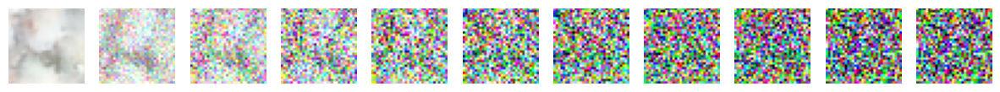

Loss in epoch 181 is: 0.0278
Loss in epoch 182 is: 0.0273
Loss in epoch 183 is: 0.0289
Loss in epoch 184 is: 0.0284
Loss in epoch 185 is: 0.0272
Loss in epoch 186 is: 0.0273
Loss in epoch 187 is: 0.0283
Loss in epoch 188 is: 0.0283
Loss in epoch 189 is: 0.0288
Loss in epoch 190 is: 0.0281
Loss in epoch 191 is: 0.0267
Loss in epoch 192 is: 0.0288
Loss in epoch 193 is: 0.0278
Loss in epoch 194 is: 0.0283
Loss in epoch 195 is: 0.0284
Loss in epoch 196 is: 0.0275
Loss in epoch 197 is: 0.0277
Loss in epoch 198 is: 0.0275
Loss in epoch 199 is: 0.0283
Loss in epoch 200 is: 0.0277


<Figure size 640x480 with 0 Axes>

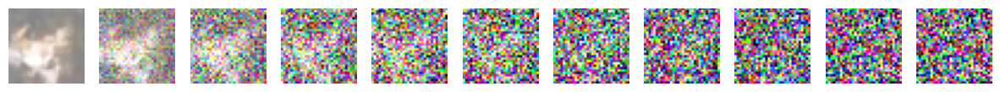

Loss in epoch 201 is: 0.0265
Loss in epoch 202 is: 0.0304
Loss in epoch 203 is: 0.0284
Loss in epoch 204 is: 0.0301
Loss in epoch 205 is: 0.0278
Loss in epoch 206 is: 0.0263
Loss in epoch 207 is: 0.0278
Loss in epoch 208 is: 0.0286
Loss in epoch 209 is: 0.0267
Loss in epoch 210 is: 0.0270
Loss in epoch 211 is: 0.0291
Loss in epoch 212 is: 0.0274
Loss in epoch 213 is: 0.0275
Loss in epoch 214 is: 0.0276
Loss in epoch 215 is: 0.0272
Loss in epoch 216 is: 0.0286
Loss in epoch 217 is: 0.0273
Loss in epoch 218 is: 0.0271
Loss in epoch 219 is: 0.0281
Loss in epoch 220 is: 0.0273


<Figure size 640x480 with 0 Axes>

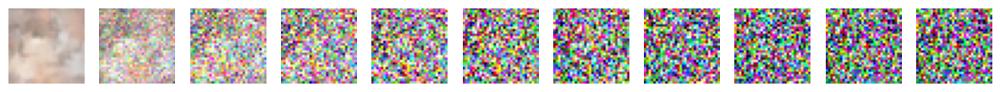

Loss in epoch 221 is: 0.0286
Loss in epoch 222 is: 0.0265
Loss in epoch 223 is: 0.0262
Loss in epoch 224 is: 0.0273
Loss in epoch 225 is: 0.0277
Loss in epoch 226 is: 0.0247
Loss in epoch 227 is: 0.0278
Loss in epoch 228 is: 0.0271
Loss in epoch 229 is: 0.0270
Loss in epoch 230 is: 0.0272
Loss in epoch 231 is: 0.0276
Loss in epoch 232 is: 0.0272
Loss in epoch 233 is: 0.0267
Loss in epoch 234 is: 0.0278
Loss in epoch 235 is: 0.0267
Loss in epoch 236 is: 0.0271
Loss in epoch 237 is: 0.0276
Loss in epoch 238 is: 0.0270
Loss in epoch 239 is: 0.0270
Loss in epoch 240 is: 0.0264


<Figure size 640x480 with 0 Axes>

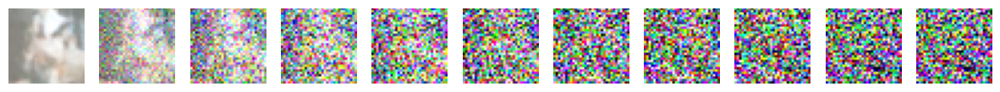

Loss in epoch 241 is: 0.0269
Loss in epoch 242 is: 0.0277
Loss in epoch 243 is: 0.0270
Loss in epoch 244 is: 0.0273
Loss in epoch 245 is: 0.0287
Loss in epoch 246 is: 0.0280
Loss in epoch 247 is: 0.0275
Loss in epoch 248 is: 0.0267
Loss in epoch 249 is: 0.0283
Loss in epoch 250 is: 0.0250
Loss in epoch 251 is: 0.0274
Loss in epoch 252 is: 0.0253
Loss in epoch 253 is: 0.0270
Loss in epoch 254 is: 0.0275
Loss in epoch 255 is: 0.0271
Loss in epoch 256 is: 0.0275
Loss in epoch 257 is: 0.0270
Loss in epoch 258 is: 0.0245
Loss in epoch 259 is: 0.0254
Loss in epoch 260 is: 0.0277


<Figure size 640x480 with 0 Axes>

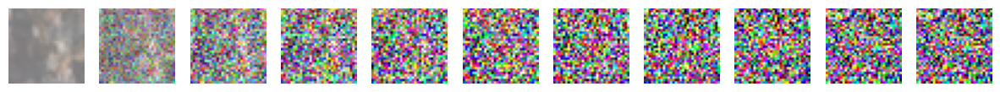

Loss in epoch 261 is: 0.0286
Loss in epoch 262 is: 0.0266
Loss in epoch 263 is: 0.0273
Loss in epoch 264 is: 0.0274
Loss in epoch 265 is: 0.0256
Loss in epoch 266 is: 0.0265
Loss in epoch 267 is: 0.0272
Loss in epoch 268 is: 0.0293
Loss in epoch 269 is: 0.0285
Loss in epoch 270 is: 0.0261
Loss in epoch 271 is: 0.0267
Loss in epoch 272 is: 0.0264
Loss in epoch 273 is: 0.0271
Loss in epoch 274 is: 0.0282
Loss in epoch 275 is: 0.0263
Loss in epoch 276 is: 0.0260
Loss in epoch 277 is: 0.0262
Loss in epoch 278 is: 0.0257
Loss in epoch 279 is: 0.0249
Loss in epoch 280 is: 0.0260


<Figure size 640x480 with 0 Axes>

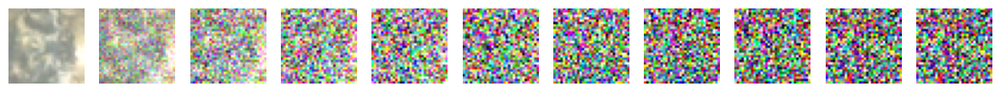

Loss in epoch 281 is: 0.0253
Loss in epoch 282 is: 0.0269
Loss in epoch 283 is: 0.0268
Loss in epoch 284 is: 0.0274
Loss in epoch 285 is: 0.0267
Loss in epoch 286 is: 0.0262
Loss in epoch 287 is: 0.0263
Loss in epoch 288 is: 0.0262
Loss in epoch 289 is: 0.0271
Loss in epoch 290 is: 0.0268
Loss in epoch 291 is: 0.0270
Loss in epoch 292 is: 0.0264
Loss in epoch 293 is: 0.0259
Loss in epoch 294 is: 0.0264
Loss in epoch 295 is: 0.0269
Loss in epoch 296 is: 0.0261
Loss in epoch 297 is: 0.0249
Loss in epoch 298 is: 0.0267
Loss in epoch 299 is: 0.0261
Loss in epoch 300 is: 0.0261


<Figure size 640x480 with 0 Axes>

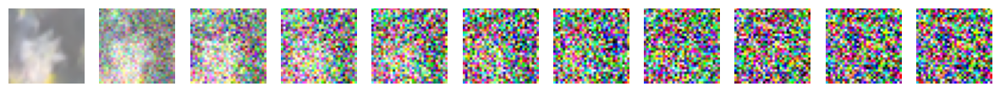

Loss in epoch 301 is: 0.0260
Loss in epoch 302 is: 0.0270
Loss in epoch 303 is: 0.0267
Loss in epoch 304 is: 0.0264
Loss in epoch 305 is: 0.0263
Loss in epoch 306 is: 0.0249
Loss in epoch 307 is: 0.0262
Loss in epoch 308 is: 0.0256
Loss in epoch 309 is: 0.0257
Loss in epoch 310 is: 0.0265
Loss in epoch 311 is: 0.0264
Loss in epoch 312 is: 0.0266
Loss in epoch 313 is: 0.0268
Loss in epoch 314 is: 0.0266
Loss in epoch 315 is: 0.0267
Loss in epoch 316 is: 0.0262
Loss in epoch 317 is: 0.0266
Loss in epoch 318 is: 0.0264
Loss in epoch 319 is: 0.0273
Loss in epoch 320 is: 0.0264


<Figure size 640x480 with 0 Axes>

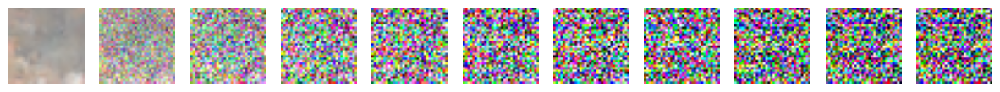

Loss in epoch 321 is: 0.0266
Loss in epoch 322 is: 0.0266
Loss in epoch 323 is: 0.0253
Loss in epoch 324 is: 0.0266
Loss in epoch 325 is: 0.0267
Loss in epoch 326 is: 0.0259
Loss in epoch 327 is: 0.0257
Loss in epoch 328 is: 0.0264
Loss in epoch 329 is: 0.0267
Loss in epoch 330 is: 0.0261
Loss in epoch 331 is: 0.0260
Loss in epoch 332 is: 0.0262
Loss in epoch 333 is: 0.0257
Loss in epoch 334 is: 0.0250
Loss in epoch 335 is: 0.0260
Loss in epoch 336 is: 0.0256
Loss in epoch 337 is: 0.0268
Loss in epoch 338 is: 0.0256
Loss in epoch 339 is: 0.0267
Loss in epoch 340 is: 0.0254


<Figure size 640x480 with 0 Axes>

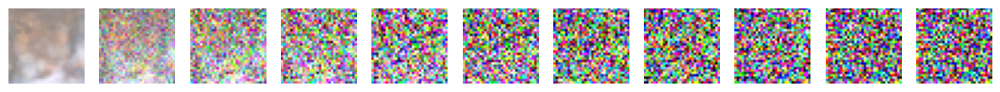

Loss in epoch 341 is: 0.0241
Loss in epoch 342 is: 0.0246
Loss in epoch 343 is: 0.0265
Loss in epoch 344 is: 0.0270
Loss in epoch 345 is: 0.0258
Loss in epoch 346 is: 0.0255
Loss in epoch 347 is: 0.0273
Loss in epoch 348 is: 0.0259
Loss in epoch 349 is: 0.0261
Loss in epoch 350 is: 0.0255
Loss in epoch 351 is: 0.0266
Loss in epoch 352 is: 0.0250
Loss in epoch 353 is: 0.0254
Loss in epoch 354 is: 0.0261
Loss in epoch 355 is: 0.0252
Loss in epoch 356 is: 0.0264
Loss in epoch 357 is: 0.0261
Loss in epoch 358 is: 0.0252
Loss in epoch 359 is: 0.0257
Loss in epoch 360 is: 0.0245


<Figure size 640x480 with 0 Axes>

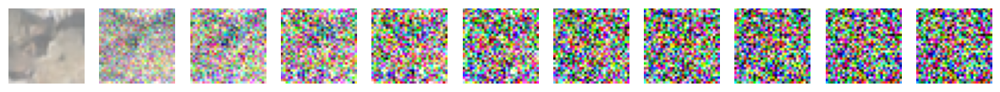

Loss in epoch 361 is: 0.0236
Loss in epoch 362 is: 0.0275
Loss in epoch 363 is: 0.0247
Loss in epoch 364 is: 0.0260
Loss in epoch 365 is: 0.0249
Loss in epoch 366 is: 0.0286
Loss in epoch 367 is: 0.0274
Loss in epoch 368 is: 0.0264
Loss in epoch 369 is: 0.0264
Loss in epoch 370 is: 0.0267
Loss in epoch 371 is: 0.0264
Loss in epoch 372 is: 0.0251
Loss in epoch 373 is: 0.0263
Loss in epoch 374 is: 0.0248
Loss in epoch 375 is: 0.0255
Loss in epoch 376 is: 0.0255
Loss in epoch 377 is: 0.0254
Loss in epoch 378 is: 0.0264
Loss in epoch 379 is: 0.0248
Loss in epoch 380 is: 0.0262


<Figure size 640x480 with 0 Axes>

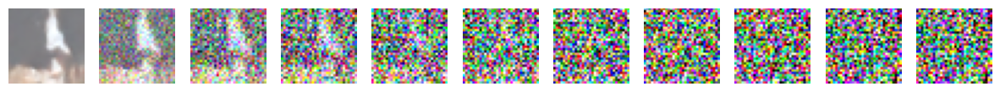

Loss in epoch 381 is: 0.0252
Loss in epoch 382 is: 0.0263
Loss in epoch 383 is: 0.0261
Loss in epoch 384 is: 0.0260
Loss in epoch 385 is: 0.0256
Loss in epoch 386 is: 0.0259
Loss in epoch 387 is: 0.0249
Loss in epoch 388 is: 0.0258
Loss in epoch 389 is: 0.0249
Loss in epoch 390 is: 0.0254
Loss in epoch 391 is: 0.0240
Loss in epoch 392 is: 0.0249
Loss in epoch 393 is: 0.0240
Loss in epoch 394 is: 0.0241
Loss in epoch 395 is: 0.0246
Loss in epoch 396 is: 0.0257
Loss in epoch 397 is: 0.0258
Loss in epoch 398 is: 0.0263
Loss in epoch 399 is: 0.0264
Loss in epoch 400 is: 0.0251


<Figure size 640x480 with 0 Axes>

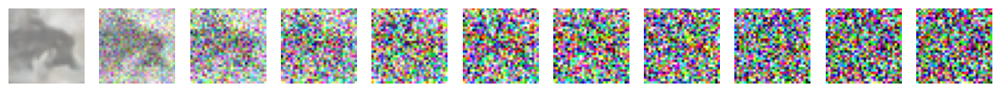

Loss in epoch 401 is: 0.0255
Loss in epoch 402 is: 0.0257
Loss in epoch 403 is: 0.0260
Loss in epoch 404 is: 0.0259
Loss in epoch 405 is: 0.0256
Loss in epoch 406 is: 0.0277
Loss in epoch 407 is: 0.0254
Loss in epoch 408 is: 0.0247
Loss in epoch 409 is: 0.0254
Loss in epoch 410 is: 0.0246
Loss in epoch 411 is: 0.0247
Loss in epoch 412 is: 0.0260
Loss in epoch 413 is: 0.0250
Loss in epoch 414 is: 0.0256
Loss in epoch 415 is: 0.0253
Loss in epoch 416 is: 0.0259
Loss in epoch 417 is: 0.0252
Loss in epoch 418 is: 0.0251
Loss in epoch 419 is: 0.0256
Loss in epoch 420 is: 0.0251


<Figure size 640x480 with 0 Axes>

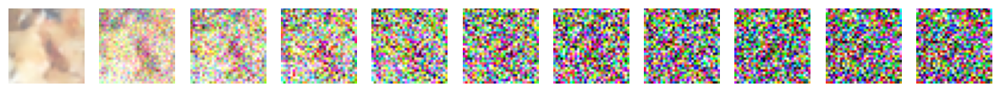

Loss in epoch 421 is: 0.0262
Loss in epoch 422 is: 0.0236
Loss in epoch 423 is: 0.0246
Loss in epoch 424 is: 0.0258
Loss in epoch 425 is: 0.0263
Loss in epoch 426 is: 0.0242
Loss in epoch 427 is: 0.0265
Loss in epoch 428 is: 0.0256
Loss in epoch 429 is: 0.0249
Loss in epoch 430 is: 0.0246
Loss in epoch 431 is: 0.0246
Loss in epoch 432 is: 0.0244
Loss in epoch 433 is: 0.0258
Loss in epoch 434 is: 0.0261
Loss in epoch 435 is: 0.0250
Loss in epoch 436 is: 0.0250
Loss in epoch 437 is: 0.0256
Loss in epoch 438 is: 0.0260
Loss in epoch 439 is: 0.0254
Loss in epoch 440 is: 0.0254


<Figure size 640x480 with 0 Axes>

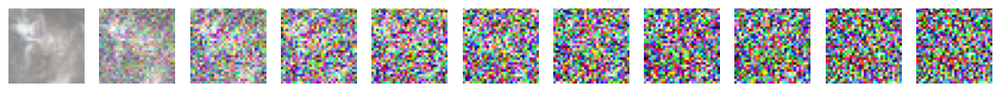

Loss in epoch 441 is: 0.0262
Loss in epoch 442 is: 0.0257
Loss in epoch 443 is: 0.0250
Loss in epoch 444 is: 0.0245
Loss in epoch 445 is: 0.0261
Loss in epoch 446 is: 0.0250
Loss in epoch 447 is: 0.0250
Loss in epoch 448 is: 0.0268
Loss in epoch 449 is: 0.0256
Loss in epoch 450 is: 0.0245
Loss in epoch 451 is: 0.0252
Loss in epoch 452 is: 0.0248
Loss in epoch 453 is: 0.0259
Loss in epoch 454 is: 0.0260
Loss in epoch 455 is: 0.0249
Loss in epoch 456 is: 0.0254
Loss in epoch 457 is: 0.0248
Loss in epoch 458 is: 0.0254
Loss in epoch 459 is: 0.0251
Loss in epoch 460 is: 0.0263


<Figure size 640x480 with 0 Axes>

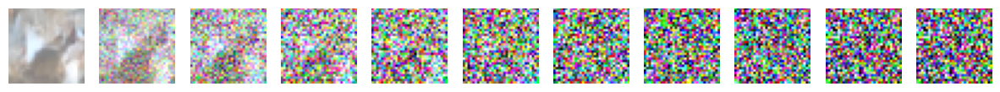

Loss in epoch 461 is: 0.0249
Loss in epoch 462 is: 0.0241
Loss in epoch 463 is: 0.0254
Loss in epoch 464 is: 0.0263
Loss in epoch 465 is: 0.0249
Loss in epoch 466 is: 0.0253
Loss in epoch 467 is: 0.0237
Loss in epoch 468 is: 0.0255
Loss in epoch 469 is: 0.0246
Loss in epoch 470 is: 0.0259
Loss in epoch 471 is: 0.0250
Loss in epoch 472 is: 0.0244
Loss in epoch 473 is: 0.0231
Loss in epoch 474 is: 0.0246
Loss in epoch 475 is: 0.0259
Loss in epoch 476 is: 0.0253
Loss in epoch 477 is: 0.0249
Loss in epoch 478 is: 0.0262
Loss in epoch 479 is: 0.0250
Loss in epoch 480 is: 0.0257


<Figure size 640x480 with 0 Axes>

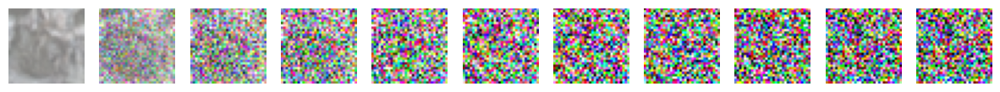

Loss in epoch 481 is: 0.0254
Loss in epoch 482 is: 0.0267
Loss in epoch 483 is: 0.0257
Loss in epoch 484 is: 0.0255
Loss in epoch 485 is: 0.0258
Loss in epoch 486 is: 0.0258
Loss in epoch 487 is: 0.0255
Loss in epoch 488 is: 0.0254
Loss in epoch 489 is: 0.0249
Loss in epoch 490 is: 0.0244
Loss in epoch 491 is: 0.0253
Loss in epoch 492 is: 0.0253
Loss in epoch 493 is: 0.0259
Loss in epoch 494 is: 0.0245
Loss in epoch 495 is: 0.0255
Loss in epoch 496 is: 0.0236
Loss in epoch 497 is: 0.0259
Loss in epoch 498 is: 0.0255
Loss in epoch 499 is: 0.0240
Loss in epoch 500 is: 0.0249


<Figure size 640x480 with 0 Axes>

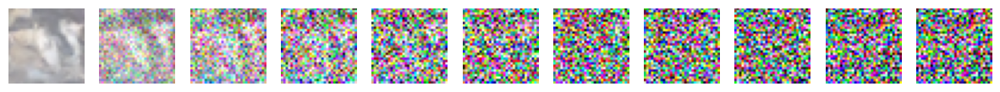

Loss in epoch 501 is: 0.0247
Loss in epoch 502 is: 0.0252
Loss in epoch 503 is: 0.0260
Loss in epoch 504 is: 0.0249
Loss in epoch 505 is: 0.0251
Loss in epoch 506 is: 0.0247
Loss in epoch 507 is: 0.0249
Loss in epoch 508 is: 0.0245
Loss in epoch 509 is: 0.0245
Loss in epoch 510 is: 0.0249
Loss in epoch 511 is: 0.0246
Loss in epoch 512 is: 0.0250
Loss in epoch 513 is: 0.0258
Loss in epoch 514 is: 0.0246
Loss in epoch 515 is: 0.0248
Loss in epoch 516 is: 0.0250
Loss in epoch 517 is: 0.0257
Loss in epoch 518 is: 0.0263
Loss in epoch 519 is: 0.0255
Loss in epoch 520 is: 0.0250


<Figure size 640x480 with 0 Axes>

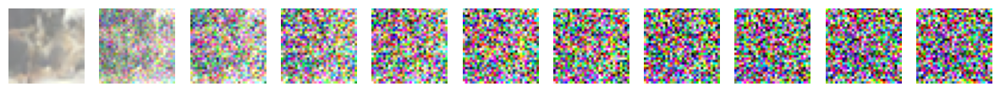

Loss in epoch 521 is: 0.0247
Loss in epoch 522 is: 0.0252
Loss in epoch 523 is: 0.0251
Loss in epoch 524 is: 0.0256
Loss in epoch 525 is: 0.0245
Loss in epoch 526 is: 0.0262
Loss in epoch 527 is: 0.0250
Loss in epoch 528 is: 0.0253
Loss in epoch 529 is: 0.0244
Loss in epoch 530 is: 0.0252
Loss in epoch 531 is: 0.0243
Loss in epoch 532 is: 0.0255
Loss in epoch 533 is: 0.0256
Loss in epoch 534 is: 0.0245
Loss in epoch 535 is: 0.0250
Loss in epoch 536 is: 0.0245
Loss in epoch 537 is: 0.0253
Loss in epoch 538 is: 0.0246
Loss in epoch 539 is: 0.0249
Loss in epoch 540 is: 0.0251


<Figure size 640x480 with 0 Axes>

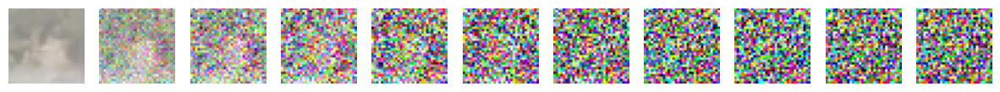

Loss in epoch 541 is: 0.0242
Loss in epoch 542 is: 0.0251
Loss in epoch 543 is: 0.0242
Loss in epoch 544 is: 0.0260
Loss in epoch 545 is: 0.0254
Loss in epoch 546 is: 0.0243
Loss in epoch 547 is: 0.0248
Loss in epoch 548 is: 0.0247
Loss in epoch 549 is: 0.0245
Loss in epoch 550 is: 0.0250
Loss in epoch 551 is: 0.0248
Loss in epoch 552 is: 0.0261
Loss in epoch 553 is: 0.0256
Loss in epoch 554 is: 0.0252
Loss in epoch 555 is: 0.0249
Loss in epoch 556 is: 0.0243
Loss in epoch 557 is: 0.0254
Loss in epoch 558 is: 0.0250
Loss in epoch 559 is: 0.0257
Loss in epoch 560 is: 0.0240


<Figure size 640x480 with 0 Axes>

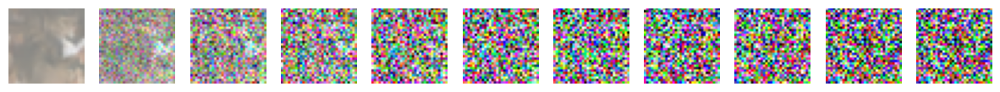

Loss in epoch 561 is: 0.0244
Loss in epoch 562 is: 0.0245
Loss in epoch 563 is: 0.0252
Loss in epoch 564 is: 0.0238
Loss in epoch 565 is: 0.0253
Loss in epoch 566 is: 0.0256
Loss in epoch 567 is: 0.0253
Loss in epoch 568 is: 0.0249
Loss in epoch 569 is: 0.0246
Loss in epoch 570 is: 0.0251
Loss in epoch 571 is: 0.0247
Loss in epoch 572 is: 0.0240
Loss in epoch 573 is: 0.0245
Loss in epoch 574 is: 0.0243
Loss in epoch 575 is: 0.0242
Loss in epoch 576 is: 0.0246
Loss in epoch 577 is: 0.0243
Loss in epoch 578 is: 0.0248
Loss in epoch 579 is: 0.0248
Loss in epoch 580 is: 0.0239


<Figure size 640x480 with 0 Axes>

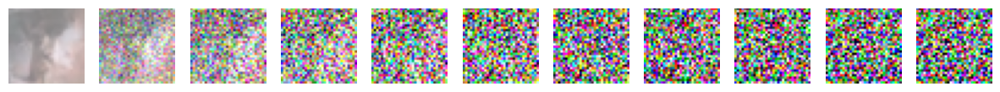

Loss in epoch 581 is: 0.0251
Loss in epoch 582 is: 0.0249
Loss in epoch 583 is: 0.0235
Loss in epoch 584 is: 0.0260
Loss in epoch 585 is: 0.0245
Loss in epoch 586 is: 0.0251
Loss in epoch 587 is: 0.0258
Loss in epoch 588 is: 0.0240
Loss in epoch 589 is: 0.0236
Loss in epoch 590 is: 0.0238
Loss in epoch 591 is: 0.0245
Loss in epoch 592 is: 0.0244
Loss in epoch 593 is: 0.0252
Loss in epoch 594 is: 0.0248
Loss in epoch 595 is: 0.0252
Loss in epoch 596 is: 0.0233
Loss in epoch 597 is: 0.0235
Loss in epoch 598 is: 0.0239
Loss in epoch 599 is: 0.0233
Loss in epoch 600 is: 0.0252


<Figure size 640x480 with 0 Axes>

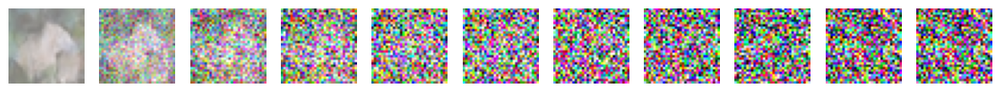

Loss in epoch 601 is: 0.0254
Loss in epoch 602 is: 0.0238
Loss in epoch 603 is: 0.0242
Loss in epoch 604 is: 0.0241
Loss in epoch 605 is: 0.0255
Loss in epoch 606 is: 0.0253
Loss in epoch 607 is: 0.0247
Loss in epoch 608 is: 0.0241
Loss in epoch 609 is: 0.0241
Loss in epoch 610 is: 0.0244
Loss in epoch 611 is: 0.0247
Loss in epoch 612 is: 0.0247
Loss in epoch 613 is: 0.0231
Loss in epoch 614 is: 0.0238
Loss in epoch 615 is: 0.0244
Loss in epoch 616 is: 0.0249
Loss in epoch 617 is: 0.0255
Loss in epoch 618 is: 0.0256
Loss in epoch 619 is: 0.0245
Loss in epoch 620 is: 0.0256


<Figure size 640x480 with 0 Axes>

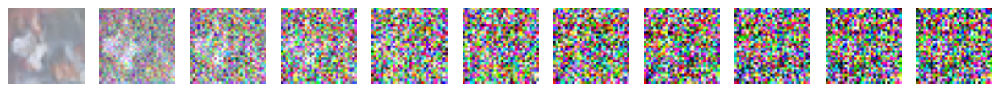

Loss in epoch 621 is: 0.0239
Loss in epoch 622 is: 0.0249
Loss in epoch 623 is: 0.0245
Loss in epoch 624 is: 0.0252
Loss in epoch 625 is: 0.0247
Loss in epoch 626 is: 0.0245
Loss in epoch 627 is: 0.0243
Loss in epoch 628 is: 0.0236
Loss in epoch 629 is: 0.0243
Loss in epoch 630 is: 0.0245
Loss in epoch 631 is: 0.0245
Loss in epoch 632 is: 0.0247
Loss in epoch 633 is: 0.0248
Loss in epoch 634 is: 0.0254
Loss in epoch 635 is: 0.0253
Loss in epoch 636 is: 0.0244
Loss in epoch 637 is: 0.0247
Loss in epoch 638 is: 0.0241
Loss in epoch 639 is: 0.0237
Loss in epoch 640 is: 0.0241


<Figure size 640x480 with 0 Axes>

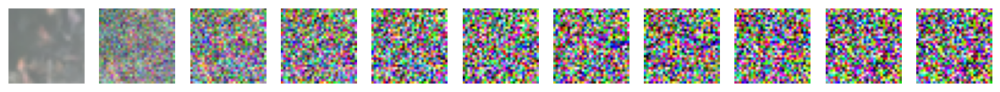

Loss in epoch 641 is: 0.0250
Loss in epoch 642 is: 0.0244
Loss in epoch 643 is: 0.0242
Loss in epoch 644 is: 0.0245
Loss in epoch 645 is: 0.0246
Loss in epoch 646 is: 0.0240
Loss in epoch 647 is: 0.0250
Loss in epoch 648 is: 0.0238
Loss in epoch 649 is: 0.0249
Loss in epoch 650 is: 0.0252
Loss in epoch 651 is: 0.0244
Loss in epoch 652 is: 0.0244
Loss in epoch 653 is: 0.0258
Loss in epoch 654 is: 0.0249
Loss in epoch 655 is: 0.0238
Loss in epoch 656 is: 0.0220
Loss in epoch 657 is: 0.0242
Loss in epoch 658 is: 0.0246
Loss in epoch 659 is: 0.0252
Loss in epoch 660 is: 0.0247


<Figure size 640x480 with 0 Axes>

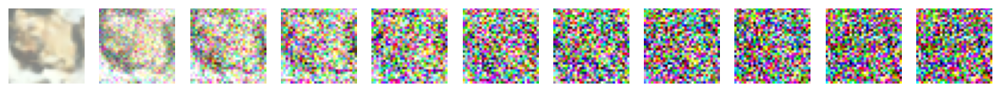

Loss in epoch 661 is: 0.0228
Loss in epoch 662 is: 0.0235
Loss in epoch 663 is: 0.0245
Loss in epoch 664 is: 0.0245
Loss in epoch 665 is: 0.0255
Loss in epoch 666 is: 0.0249
Loss in epoch 667 is: 0.0243
Loss in epoch 668 is: 0.0233
Loss in epoch 669 is: 0.0247
Loss in epoch 670 is: 0.0259
Loss in epoch 671 is: 0.0238
Loss in epoch 672 is: 0.0247
Loss in epoch 673 is: 0.0250
Loss in epoch 674 is: 0.0241
Loss in epoch 675 is: 0.0253
Loss in epoch 676 is: 0.0244
Loss in epoch 677 is: 0.0250
Loss in epoch 678 is: 0.0239
Loss in epoch 679 is: 0.0253
Loss in epoch 680 is: 0.0250


<Figure size 640x480 with 0 Axes>

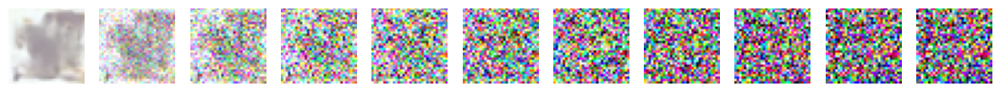

Loss in epoch 681 is: 0.0242
Loss in epoch 682 is: 0.0241
Loss in epoch 683 is: 0.0246
Loss in epoch 684 is: 0.0236
Loss in epoch 685 is: 0.0245
Loss in epoch 686 is: 0.0241
Loss in epoch 687 is: 0.0251
Loss in epoch 688 is: 0.0247
Loss in epoch 689 is: 0.0235
Loss in epoch 690 is: 0.0237
Loss in epoch 691 is: 0.0240
Loss in epoch 692 is: 0.0250
Loss in epoch 693 is: 0.0237
Loss in epoch 694 is: 0.0246
Loss in epoch 695 is: 0.0254
Loss in epoch 696 is: 0.0232
Loss in epoch 697 is: 0.0246
Loss in epoch 698 is: 0.0248
Loss in epoch 699 is: 0.0247
Loss in epoch 700 is: 0.0249


<Figure size 640x480 with 0 Axes>

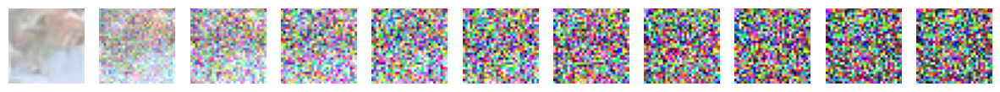

Loss in epoch 701 is: 0.0245
Loss in epoch 702 is: 0.0246
Loss in epoch 703 is: 0.0241
Loss in epoch 704 is: 0.0256
Loss in epoch 705 is: 0.0242
Loss in epoch 706 is: 0.0232
Loss in epoch 707 is: 0.0239
Loss in epoch 708 is: 0.0238
Loss in epoch 709 is: 0.0245
Loss in epoch 710 is: 0.0247
Loss in epoch 711 is: 0.0261
Loss in epoch 712 is: 0.0255
Loss in epoch 713 is: 0.0237
Loss in epoch 714 is: 0.0235
Loss in epoch 715 is: 0.0246
Loss in epoch 716 is: 0.0239
Loss in epoch 717 is: 0.0242
Loss in epoch 718 is: 0.0242
Loss in epoch 719 is: 0.0237
Loss in epoch 720 is: 0.0239


<Figure size 640x480 with 0 Axes>

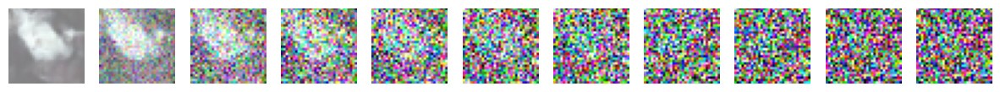

Loss in epoch 721 is: 0.0247
Loss in epoch 722 is: 0.0246
Loss in epoch 723 is: 0.0239
Loss in epoch 724 is: 0.0240
Loss in epoch 725 is: 0.0252
Loss in epoch 726 is: 0.0248
Loss in epoch 727 is: 0.0250
Loss in epoch 728 is: 0.0239
Loss in epoch 729 is: 0.0242
Loss in epoch 730 is: 0.0244
Loss in epoch 731 is: 0.0242
Loss in epoch 732 is: 0.0237
Loss in epoch 733 is: 0.0234
Loss in epoch 734 is: 0.0231
Loss in epoch 735 is: 0.0246
Loss in epoch 736 is: 0.0259
Loss in epoch 737 is: 0.0251
Loss in epoch 738 is: 0.0237
Loss in epoch 739 is: 0.0244
Loss in epoch 740 is: 0.0236


<Figure size 640x480 with 0 Axes>

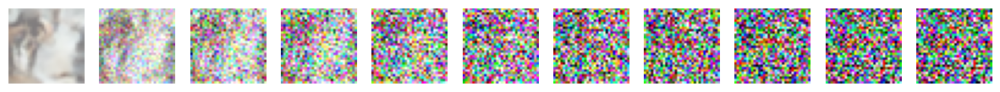

Loss in epoch 741 is: 0.0245
Loss in epoch 742 is: 0.0236
Loss in epoch 743 is: 0.0235
Loss in epoch 744 is: 0.0258
Loss in epoch 745 is: 0.0245
Loss in epoch 746 is: 0.0238
Loss in epoch 747 is: 0.0234
Loss in epoch 748 is: 0.0244
Loss in epoch 749 is: 0.0239
Loss in epoch 750 is: 0.0240
Loss in epoch 751 is: 0.0250
Loss in epoch 752 is: 0.0243
Loss in epoch 753 is: 0.0234
Loss in epoch 754 is: 0.0240
Loss in epoch 755 is: 0.0244
Loss in epoch 756 is: 0.0241
Loss in epoch 757 is: 0.0235
Loss in epoch 758 is: 0.0242
Loss in epoch 759 is: 0.0238
Loss in epoch 760 is: 0.0238


<Figure size 640x480 with 0 Axes>

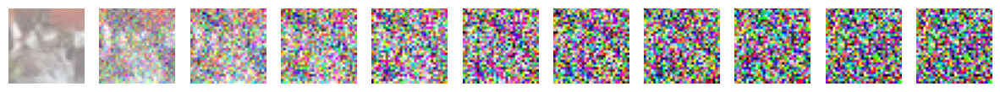

Loss in epoch 761 is: 0.0242
Loss in epoch 762 is: 0.0250
Loss in epoch 763 is: 0.0248
Loss in epoch 764 is: 0.0245
Loss in epoch 765 is: 0.0244
Loss in epoch 766 is: 0.0252
Loss in epoch 767 is: 0.0252
Loss in epoch 768 is: 0.0241
Loss in epoch 769 is: 0.0250
Loss in epoch 770 is: 0.0249
Loss in epoch 771 is: 0.0238
Loss in epoch 772 is: 0.0246
Loss in epoch 773 is: 0.0236
Loss in epoch 774 is: 0.0245
Loss in epoch 775 is: 0.0255
Loss in epoch 776 is: 0.0239
Loss in epoch 777 is: 0.0240
Loss in epoch 778 is: 0.0241
Loss in epoch 779 is: 0.0228
Loss in epoch 780 is: 0.0249


<Figure size 640x480 with 0 Axes>

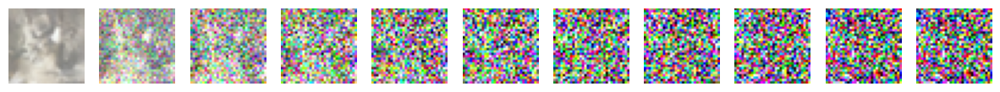

Loss in epoch 781 is: 0.0229
Loss in epoch 782 is: 0.0247
Loss in epoch 783 is: 0.0247
Loss in epoch 784 is: 0.0241
Loss in epoch 785 is: 0.0242
Loss in epoch 786 is: 0.0242
Loss in epoch 787 is: 0.0251
Loss in epoch 788 is: 0.0239
Loss in epoch 789 is: 0.0237
Loss in epoch 790 is: 0.0245
Loss in epoch 791 is: 0.0243
Loss in epoch 792 is: 0.0258
Loss in epoch 793 is: 0.0239
Loss in epoch 794 is: 0.0261
Loss in epoch 795 is: 0.0236
Loss in epoch 796 is: 0.0244
Loss in epoch 797 is: 0.0237
Loss in epoch 798 is: 0.0255
Loss in epoch 799 is: 0.0243
Loss in epoch 800 is: 0.0239


<Figure size 640x480 with 0 Axes>

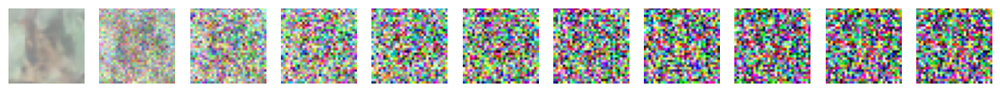

Loss in epoch 801 is: 0.0240
Loss in epoch 802 is: 0.0248
Loss in epoch 803 is: 0.0240
Loss in epoch 804 is: 0.0249
Loss in epoch 805 is: 0.0239
Loss in epoch 806 is: 0.0246
Loss in epoch 807 is: 0.0245
Loss in epoch 808 is: 0.0244
Loss in epoch 809 is: 0.0250
Loss in epoch 810 is: 0.0250
Loss in epoch 811 is: 0.0243
Loss in epoch 812 is: 0.0247
Loss in epoch 813 is: 0.0263
Loss in epoch 814 is: 0.0239
Loss in epoch 815 is: 0.0240
Loss in epoch 816 is: 0.0239
Loss in epoch 817 is: 0.0238
Loss in epoch 818 is: 0.0260
Loss in epoch 819 is: 0.0238
Loss in epoch 820 is: 0.0232


<Figure size 640x480 with 0 Axes>

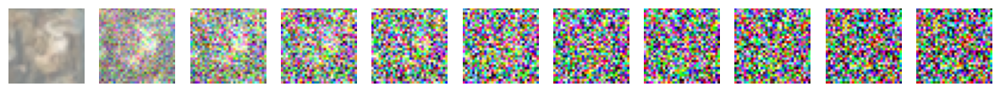

Loss in epoch 821 is: 0.0238
Loss in epoch 822 is: 0.0247
Loss in epoch 823 is: 0.0237
Loss in epoch 824 is: 0.0233
Loss in epoch 825 is: 0.0243
Loss in epoch 826 is: 0.0241
Loss in epoch 827 is: 0.0245
Loss in epoch 828 is: 0.0241
Loss in epoch 829 is: 0.0236
Loss in epoch 830 is: 0.0238
Loss in epoch 831 is: 0.0240
Loss in epoch 832 is: 0.0250
Loss in epoch 833 is: 0.0242
Loss in epoch 834 is: 0.0229
Loss in epoch 835 is: 0.0236
Loss in epoch 836 is: 0.0240
Loss in epoch 837 is: 0.0228
Loss in epoch 838 is: 0.0237
Loss in epoch 839 is: 0.0231
Loss in epoch 840 is: 0.0240


<Figure size 640x480 with 0 Axes>

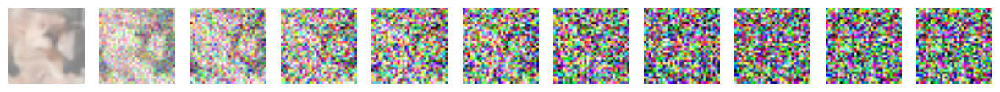

Loss in epoch 841 is: 0.0226
Loss in epoch 842 is: 0.0224
Loss in epoch 843 is: 0.0227
Loss in epoch 844 is: 0.0238
Loss in epoch 845 is: 0.0227
Loss in epoch 846 is: 0.0239
Loss in epoch 847 is: 0.0237
Loss in epoch 848 is: 0.0244
Loss in epoch 849 is: 0.0234
Loss in epoch 850 is: 0.0236
Loss in epoch 851 is: 0.0233
Loss in epoch 852 is: 0.0248
Loss in epoch 853 is: 0.0232
Loss in epoch 854 is: 0.0237
Loss in epoch 855 is: 0.0246
Loss in epoch 856 is: 0.0244
Loss in epoch 857 is: 0.0248
Loss in epoch 858 is: 0.0239
Loss in epoch 859 is: 0.0245
Loss in epoch 860 is: 0.0244


<Figure size 640x480 with 0 Axes>

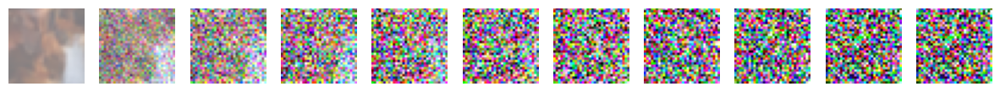

Loss in epoch 861 is: 0.0236
Loss in epoch 862 is: 0.0241
Loss in epoch 863 is: 0.0240
Loss in epoch 864 is: 0.0236
Loss in epoch 865 is: 0.0237
Loss in epoch 866 is: 0.0233
Loss in epoch 867 is: 0.0232
Loss in epoch 868 is: 0.0234
Loss in epoch 869 is: 0.0240
Loss in epoch 870 is: 0.0231
Loss in epoch 871 is: 0.0237
Loss in epoch 872 is: 0.0235
Loss in epoch 873 is: 0.0243
Loss in epoch 874 is: 0.0229
Loss in epoch 875 is: 0.0228
Loss in epoch 876 is: 0.0239
Loss in epoch 877 is: 0.0234
Loss in epoch 878 is: 0.0237
Loss in epoch 879 is: 0.0241
Loss in epoch 880 is: 0.0248


<Figure size 640x480 with 0 Axes>

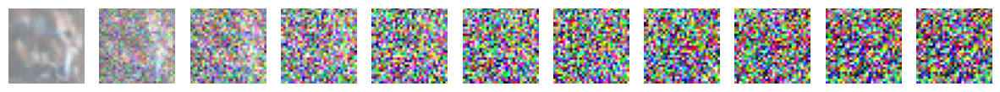

Loss in epoch 881 is: 0.0235
Loss in epoch 882 is: 0.0230
Loss in epoch 883 is: 0.0237
Loss in epoch 884 is: 0.0233
Loss in epoch 885 is: 0.0233
Loss in epoch 886 is: 0.0225
Loss in epoch 887 is: 0.0234
Loss in epoch 888 is: 0.0240
Loss in epoch 889 is: 0.0240
Loss in epoch 890 is: 0.0241
Loss in epoch 891 is: 0.0231
Loss in epoch 892 is: 0.0245
Loss in epoch 893 is: 0.0244
Loss in epoch 894 is: 0.0246
Loss in epoch 895 is: 0.0236
Loss in epoch 896 is: 0.0233
Loss in epoch 897 is: 0.0232
Loss in epoch 898 is: 0.0244
Loss in epoch 899 is: 0.0244
Loss in epoch 900 is: 0.0237


<Figure size 640x480 with 0 Axes>

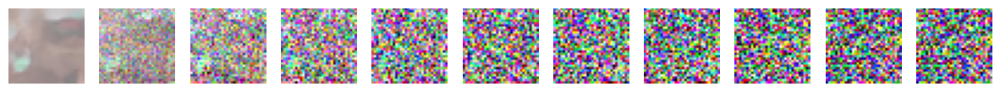

Loss in epoch 901 is: 0.0236
Loss in epoch 902 is: 0.0244
Loss in epoch 903 is: 0.0235
Loss in epoch 904 is: 0.0236
Loss in epoch 905 is: 0.0235
Loss in epoch 906 is: 0.0244
Loss in epoch 907 is: 0.0227
Loss in epoch 908 is: 0.0243
Loss in epoch 909 is: 0.0248
Loss in epoch 910 is: 0.0242
Loss in epoch 911 is: 0.0246
Loss in epoch 912 is: 0.0245
Loss in epoch 913 is: 0.0236
Loss in epoch 914 is: 0.0236
Loss in epoch 915 is: 0.0247
Loss in epoch 916 is: 0.0239
Loss in epoch 917 is: 0.0241
Loss in epoch 918 is: 0.0234
Loss in epoch 919 is: 0.0240
Loss in epoch 920 is: 0.0241


<Figure size 640x480 with 0 Axes>

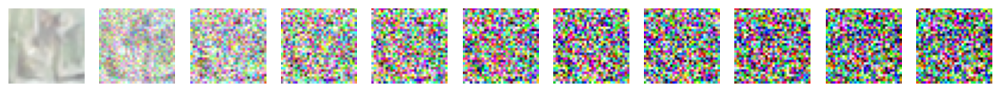

Loss in epoch 921 is: 0.0231
Loss in epoch 922 is: 0.0236
Loss in epoch 923 is: 0.0246
Loss in epoch 924 is: 0.0242
Loss in epoch 925 is: 0.0228
Loss in epoch 926 is: 0.0230
Loss in epoch 927 is: 0.0240
Loss in epoch 928 is: 0.0237
Loss in epoch 929 is: 0.0235
Loss in epoch 930 is: 0.0242
Loss in epoch 931 is: 0.0243
Loss in epoch 932 is: 0.0234
Loss in epoch 933 is: 0.0236
Loss in epoch 934 is: 0.0241
Loss in epoch 935 is: 0.0233
Loss in epoch 936 is: 0.0224
Loss in epoch 937 is: 0.0233
Loss in epoch 938 is: 0.0241
Loss in epoch 939 is: 0.0239
Loss in epoch 940 is: 0.0232


<Figure size 640x480 with 0 Axes>

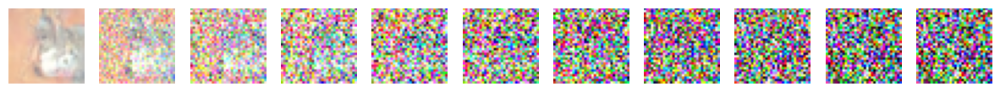

Loss in epoch 941 is: 0.0238
Loss in epoch 942 is: 0.0234
Loss in epoch 943 is: 0.0239
Loss in epoch 944 is: 0.0243
Loss in epoch 945 is: 0.0239
Loss in epoch 946 is: 0.0243
Loss in epoch 947 is: 0.0246
Loss in epoch 948 is: 0.0226
Loss in epoch 949 is: 0.0242
Loss in epoch 950 is: 0.0234
Loss in epoch 951 is: 0.0243
Loss in epoch 952 is: 0.0230
Loss in epoch 953 is: 0.0251
Loss in epoch 954 is: 0.0229
Loss in epoch 955 is: 0.0235
Loss in epoch 956 is: 0.0237
Loss in epoch 957 is: 0.0233
Loss in epoch 958 is: 0.0243
Loss in epoch 959 is: 0.0234
Loss in epoch 960 is: 0.0227


<Figure size 640x480 with 0 Axes>

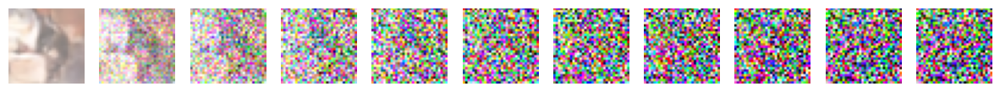

Loss in epoch 961 is: 0.0238
Loss in epoch 962 is: 0.0251
Loss in epoch 963 is: 0.0230
Loss in epoch 964 is: 0.0235
Loss in epoch 965 is: 0.0230
Loss in epoch 966 is: 0.0235
Loss in epoch 967 is: 0.0239
Loss in epoch 968 is: 0.0240
Loss in epoch 969 is: 0.0232
Loss in epoch 970 is: 0.0233
Loss in epoch 971 is: 0.0223
Loss in epoch 972 is: 0.0227
Loss in epoch 973 is: 0.0232
Loss in epoch 974 is: 0.0241
Loss in epoch 975 is: 0.0237
Loss in epoch 976 is: 0.0231
Loss in epoch 977 is: 0.0232
Loss in epoch 978 is: 0.0251
Loss in epoch 979 is: 0.0237
Loss in epoch 980 is: 0.0227


<Figure size 640x480 with 0 Axes>

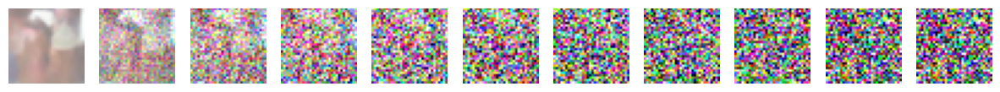

Loss in epoch 981 is: 0.0234
Loss in epoch 982 is: 0.0221
Loss in epoch 983 is: 0.0226
Loss in epoch 984 is: 0.0241
Loss in epoch 985 is: 0.0236
Loss in epoch 986 is: 0.0220
Loss in epoch 987 is: 0.0232
Loss in epoch 988 is: 0.0232
Loss in epoch 989 is: 0.0223
Loss in epoch 990 is: 0.0235
Loss in epoch 991 is: 0.0228
Loss in epoch 992 is: 0.0239
Loss in epoch 993 is: 0.0231
Loss in epoch 994 is: 0.0244
Loss in epoch 995 is: 0.0231
Loss in epoch 996 is: 0.0225
Loss in epoch 997 is: 0.0233
Loss in epoch 998 is: 0.0234
Loss in epoch 999 is: 0.0237


<Figure size 640x480 with 0 Axes>

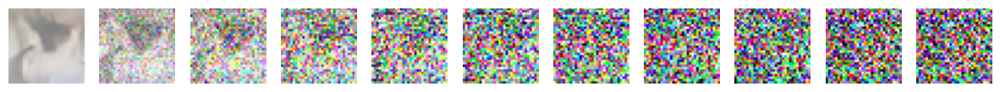

In [62]:
model = Unet(dim_mults=(1, 2, 4, 8)).to(DEVICE) # dim_mults=(1, 2, 4) works too
optimizer = Adam(model.parameters(), lr=LEARNING_RATE)
betas, alphas, alpha_bars = generate_schedule()



for epoch_i in range(EPOCHS):
  loss = train_epoch(model, dataloader, optimizer, betas)
  print(f"Loss in epoch {epoch_i} is: {loss:.4f}")
  if epoch_i % 20 == 0 or epoch_i == EPOCHS-1:
    generate_example(model, epoch_i, betas)


Training result

In [63]:
!pip install -q torchmetrics
!pip install torchmetrics[image]
!pip install torch-fidelity



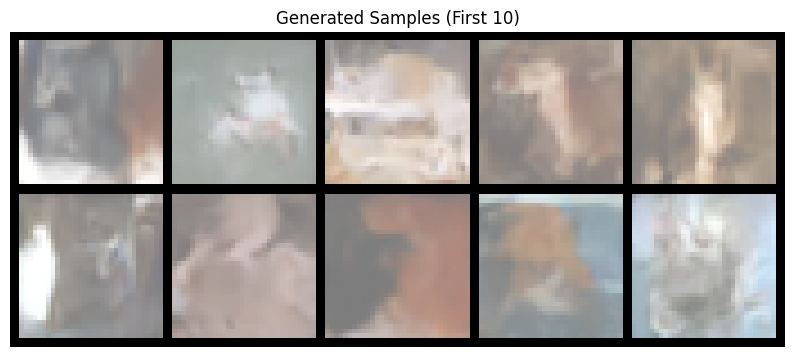

ModuleNotFoundError: FrechetInceptionDistance metric requires that `Torch-fidelity` is installed. Either install as `pip install torchmetrics[image]` or `pip install torch-fidelity`.

In [64]:
from torchmetrics.image.fid import FrechetInceptionDistance

@torch.no_grad()
def sample_images(model, num_samples=100, betas=None, img_size=32, channels=3):
    img = torch.randn((num_samples, channels, img_size, img_size), device=DEVICE)
    T = betas.shape[0]

    alphas = 1. - betas
    alphas_cumprod = torch.cumprod(alphas, axis=0)
    alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
    sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
    sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
    posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

    for t in reversed(range(T)):
        t_tensor = torch.full((num_samples,), t, device=DEVICE, dtype=torch.long)
        model_out = model(img, t_tensor)

        sqrt_recip_alpha_t = sqrt_recip_alphas[t]
        sqrt_one_minus_acp_t = sqrt_one_minus_alphas_cumprod[t]
        beta_t = betas[t]

        model_mean = sqrt_recip_alpha_t * (img - beta_t * model_out / sqrt_one_minus_acp_t)

        if t > 0:
            noise = torch.randn_like(img)
            variance = torch.sqrt(posterior_variance[t])
            img = model_mean + variance * noise
        else:
            img = model_mean

    return img.clamp(-1, 1)  # values in [-1, 1]


# Step 1: 샘플 생성
fake_images = sample_images(model, num_samples=100, betas=betas).to(DEVICE)

# Step 2: 앞의 10개만 시각화
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

def show_tensor_images(img_tensor, num_images=10):
    img_tensor = (img_tensor[:num_images] + 1) / 2  # scale to [0,1]
    grid = make_grid(img_tensor, nrow=5)
    plt.figure(figsize=(10, 5))
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
    plt.title("Generated Samples (First 10)")
    plt.show()

show_tensor_images(fake_images)

# Step 3: FID 계산
# ⚠️ 실제 이미지 불러오기: dataset에서 100개 추출
real_images = torch.stack([dataset[i] for i in range(100)]).to(DEVICE)

from torchmetrics.image.fid import FrechetInceptionDistance
fid_metric = FrechetInceptionDistance(feature=2048).to(DEVICE)

# [-1, 1] → [0, 255], uint8로 변환
real_uint8 = ((real_images + 1) * 127.5).clamp(0, 255).to(torch.uint8)
fake_uint8 = ((fake_images + 1) * 127.5).clamp(0, 255).to(torch.uint8)

fid_metric.update(real_uint8, real=True)
fid_metric.update(fake_uint8, real=False)

fid_score = fid_metric.compute().item()
print(f"FID Score: {fid_score:.4f}")


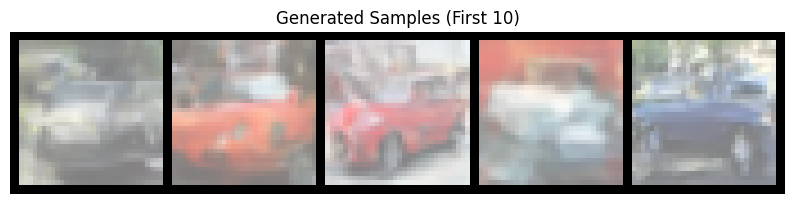

In [34]:
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

def show_tensor_images_unnormalized(img_tensor, num_images=5):
    """
    [-1, 1] 범위의 tensor 이미지를 [0, 1]로 변환 후 시각화
    """
    img_tensor = img_tensor[:num_images].clone().detach()
    img_tensor = (img_tensor + 1) / 2  # [-1, 1] → [0, 1]

    grid = make_grid(img_tensor, nrow=5)
    np_grid = grid.permute(1, 2, 0).cpu().numpy()

    plt.figure(figsize=(10, 5))
    plt.imshow(np_grid)
    plt.axis('off')
    plt.title("Generated Samples (First 10)")
    plt.show()

# 예시 호출
show_tensor_images_unnormalized(fake_images)
